<h3>Dependencies

In [1]:
import numpy as np

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import ConstantKernel, Matern, WhiteKernel, ExpSineSquared, RBF

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression

import statsmodels.api as sm
from statsmodels.formula.api import ols

from scipy.optimize import minimize

import pandas as pd

import matplotlib.pyplot as plt
from matplotlib.ticker import StrMethodFormatter
import matplotlib.dates as mdates

import datetime

### Plotting settings

In [2]:
cm = 1/2.54

fsize = 11
tsize = 18

tdir = 'in'

major = 5.0
minor = 3.0

style = 'default'

plt.style.use(style)
plt.rcParams['text.usetex'] = True
plt.rcParams["font.family"] = "serif"
plt.rcParams["figure.dpi"] = 300
plt.rcParams['font.size'] = fsize
plt.rcParams['legend.fontsize'] = tsize
plt.rcParams['xtick.direction'] = tdir
plt.rcParams['ytick.direction'] = tdir
plt.rcParams['xtick.major.size'] = major
plt.rcParams['xtick.minor.size'] = minor
plt.rcParams['ytick.major.size'] = major
plt.rcParams['ytick.minor.size'] = minor

months = [
    "January",
    "February",
    "March",
    "April",
    "May",
    "June",
    "July",
    "August",
    "September",
    "October",
    "November",
    "December"
]

### Read data

In [3]:
# Enter the local path of the data file
datapath = "D:\\Eleonora\\code\\data\\hourly_data.csv"
allData = pd.read_csv(datapath)

allData

,Unnamed: 0,sol altitude,sol azimuth,GHI,DNI,DHI,GHE,cld_ttl_amt_id,air_temperature,dewpoint,rltv_hum,stn_pres,wmo_hr_sun_dur
0,2015-01-01 00:00:00,-62.406026,347.757658,0.0,0.0,0.0,0.0,8.0,11.0,10.2,94.9,1018.9,0.0
1,2015-01-01 01:00:00,-61.951703,17.559036,0.0,0.0,0.0,0.0,8.0,11.2,10.3,93.6,1018.1,0.0
2,2015-01-01 02:00:00,-57.058634,43.206501,0.0,0.0,0.0,0.0,8.0,11.2,10.6,96.1,1018.7,0.0
3,2015-01-01 03:00:00,-49.396013,62.516002,0.0,0.0,0.0,0.0,8.0,11.2,10.8,97.4,1018.1,0.0
4,2015-01-01 04:00:00,-40.390308,77.346171,0.0,0.0,0.0,0.0,8.0,11.4,11.0,97.6,1017.5,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
17539,2016-12-31 19:00:00,-23.015333,261.153828,0.0,0.0,0.0,0.0,7.0,8.3,7.3,93.0,1017.2,0.0
17540,2016-12-31 20:00:00,-32.576621,272.423369,0.0,0.0,0.0,0.0,8.0,8.6,7.4,91.6,1016.3,0.0
17541,2016-12-31 21:00:00,-42.042118,285.090629,0.0,0.0,0.0,0.0,7.0,8.6,7.6,92.9,1015.6,0.0
17542,2016-12-31 22:00:00,-50.876181,300.564503,0.0,0.0,0.0,0.0,7.0,8.8,7.7,93.0,1014.9,0.0


### Dataframe Index explaination
**sol altitude** : 'solar altitude [degree]',<br>
**sol azimuth** : 'solar azimuth [degree]',<br>
**GHI** : 'global horizontal irradiance [W/m2]',<br>
**DNI** : 'direct normal irradiance [W/m2]',<br>
**DHI** : 'diffuse horizontal irradiance [W/m2]',<br>
**GHE** : 'global horizontal illuminance [lux]',<br>
**cld_ttl_amt_id** : 'total cloud cover [oktas 0-8] (9 for non-meteorological sky cover)',<br>
**air_temperature** : 'air temperature [degree C]',<br>
**dewpoint** : 'dew point temperature [degree C]',<br>
**rltv_hum** : 'relative humidity [%]',<br>
**stn_pres** : 'pressure [hPa]',<br>
**wmo_hr_sun_dur** : 'sunshine duration [hrs]'

### NaN cleanup | Slicing

In [4]:
# Rename certain columns to remove spaces and make them more comprehensive
allData.rename(columns = {'Unnamed: 0':'datetime', 'sol altitude':'sol_alt', 'sol azimuth': 'sol_az'}, inplace = True)

# Drop columns that contain NaN values 
data = allData.dropna()

In [5]:
data

,datetime,sol_alt,sol_az,GHI,DNI,DHI,GHE,cld_ttl_amt_id,air_temperature,dewpoint,rltv_hum,stn_pres,wmo_hr_sun_dur
0,2015-01-01 00:00:00,-62.406026,347.757658,0.0,0.0,0.0,0.0,8.0,11.0,10.2,94.9,1018.9,0.0
1,2015-01-01 01:00:00,-61.951703,17.559036,0.0,0.0,0.0,0.0,8.0,11.2,10.3,93.6,1018.1,0.0
2,2015-01-01 02:00:00,-57.058634,43.206501,0.0,0.0,0.0,0.0,8.0,11.2,10.6,96.1,1018.7,0.0
3,2015-01-01 03:00:00,-49.396013,62.516002,0.0,0.0,0.0,0.0,8.0,11.2,10.8,97.4,1018.1,0.0
4,2015-01-01 04:00:00,-40.390308,77.346171,0.0,0.0,0.0,0.0,8.0,11.4,11.0,97.6,1017.5,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
17538,2016-12-31 18:00:00,-13.731565,250.384936,0.0,0.0,0.0,0.0,8.0,8.2,7.3,94.3,1017.8,0.0
17539,2016-12-31 19:00:00,-23.015333,261.153828,0.0,0.0,0.0,0.0,7.0,8.3,7.3,93.0,1017.2,0.0
17540,2016-12-31 20:00:00,-32.576621,272.423369,0.0,0.0,0.0,0.0,8.0,8.6,7.4,91.6,1016.3,0.0
17541,2016-12-31 21:00:00,-42.042118,285.090629,0.0,0.0,0.0,0.0,7.0,8.6,7.6,92.9,1015.6,0.0


#### Create a nested structure (dictionary) to store the data, and access them using `year`, `month`, `days` as keys
e.g. `nested_data[2015][1][5]` will return a pandas DataFrame that contains the daily data, for the 5th of January 2015

In [6]:
df = pd.DataFrame(data)
df["sol_alt"] = np.clip(df["sol_alt"], 0, None)
# df = pd.DataFrame(data)
df['datetime'] = pd.to_datetime(df['datetime'])
df['hours'] = (df['datetime'] - df['datetime'].iloc[0]).dt.total_seconds() / 3600

# Create a nested data structure with DataFrames for each date
nested_data = {}

# Iterate through each row in the DataFrame and organize data by year, month, and date
for _, row in df.iterrows():
    year = row['datetime'].year
    month = row['datetime'].month
    date = row['datetime'].day

    if year not in nested_data:
        nested_data[year] = {}

    if month not in nested_data[year]:
        nested_data[year][month] = {}

    if date not in nested_data[year][month]:
        nested_data[year][month][date] = pd.DataFrame()

    # Append the row data as a new row to the DataFrame for the corresponding date
    nested_data[year][month][date] = pd.concat([nested_data[year][month][date], row.to_frame().T], ignore_index=True)


### First plots of the dataset

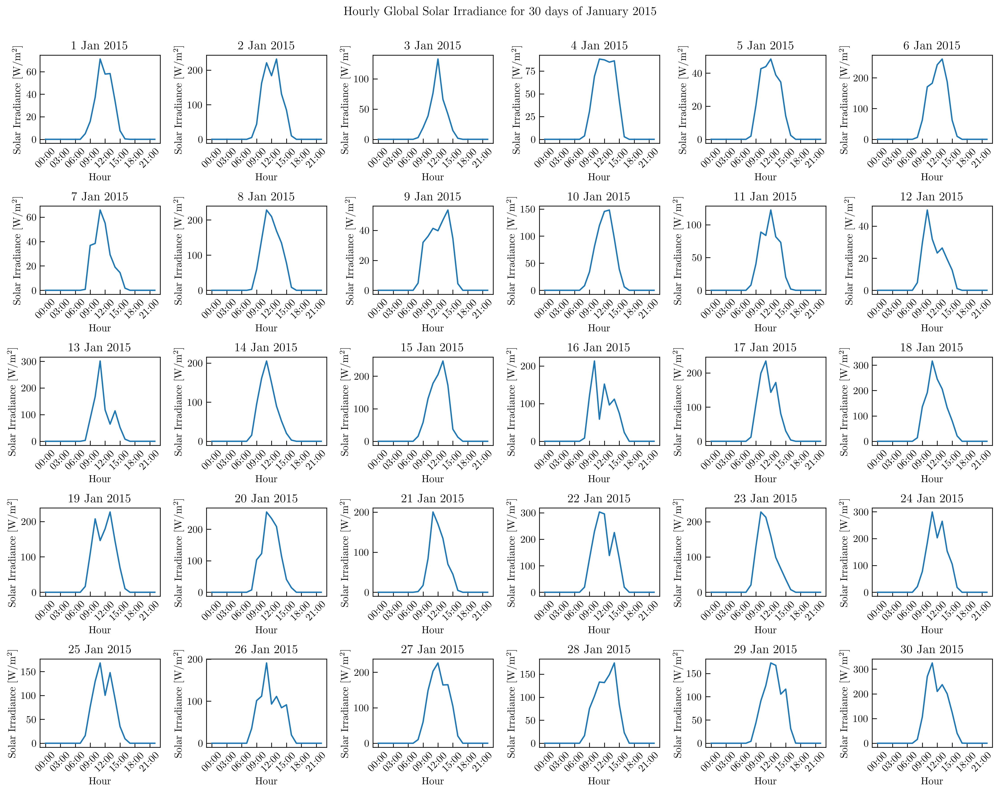

In [7]:
# Define the number of days and hours
num_days = 30
n_rows = 5
n_cols = 6

# Create a 5 by 6 grid of subplots
fig, axs = plt.subplots(n_rows, n_cols, figsize=(15, 12))
fig.suptitle('Hourly Global Solar Irradiance for 30 days of January 2015')

# Iterate through the first 30 days of June and plot the GHI values for each hour
for day in range(num_days):
    df = nested_data[2015][1][day+1]
    axs[day//n_cols, day%n_cols].plot(df['datetime'], df['GHI'])
    axs[day//n_cols, day%n_cols].set_title(f'{day+1} Jan 2015')
    axs[day//n_cols, day%n_cols].set_xlabel('Hour')
    axs[day//n_cols, day%n_cols].set_ylabel('Solar Irradiance [W/m$^2$]')
    axs[day//n_cols, day%n_cols].tick_params(axis='x', rotation=45)

    # Format the x-axis tick labels to show only the hour
    axs[day//n_cols, day%n_cols].xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))


# Adjust layout to avoid overlap of titles and labels
plt.tight_layout()
plt.subplots_adjust(top=0.92)
plt.show()


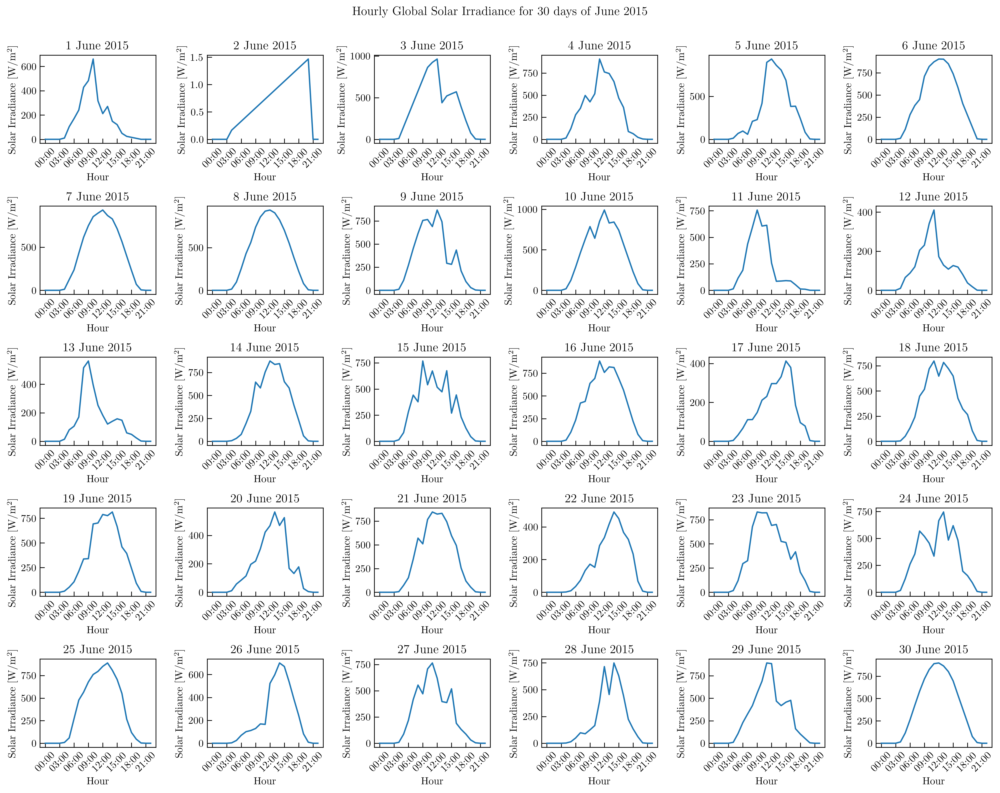

In [8]:
# Define the number of days and hours
num_days = 30
n_rows = 5
n_cols = 6

# Create a 5 by 6 grid of subplots
fig, axs = plt.subplots(n_rows, n_cols, figsize=(15, 12))
fig.suptitle('Hourly Global Solar Irradiance for 30 days of June 2015')

# Iterate through the first 30 days of June and plot the GHI values for each hour
for day in range(num_days):
    df = nested_data[2015][6][day+1]
    axs[day//n_cols, day%n_cols].plot(df['datetime'], df['GHI'])
    axs[day//n_cols, day%n_cols].set_title(f'{day+1} June 2015')
    axs[day//n_cols, day%n_cols].set_xlabel('Hour')
    axs[day//n_cols, day%n_cols].set_ylabel('Solar Irradiance [W/m$^2$]')
    axs[day//n_cols, day%n_cols].tick_params(axis='x', rotation=45)

    # Format the x-axis tick labels to show only the hour
    axs[day//n_cols, day%n_cols].xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))


# Adjust layout to avoid overlap of titles and labels
plt.tight_layout()
plt.subplots_adjust(top=0.92)
plt.show()


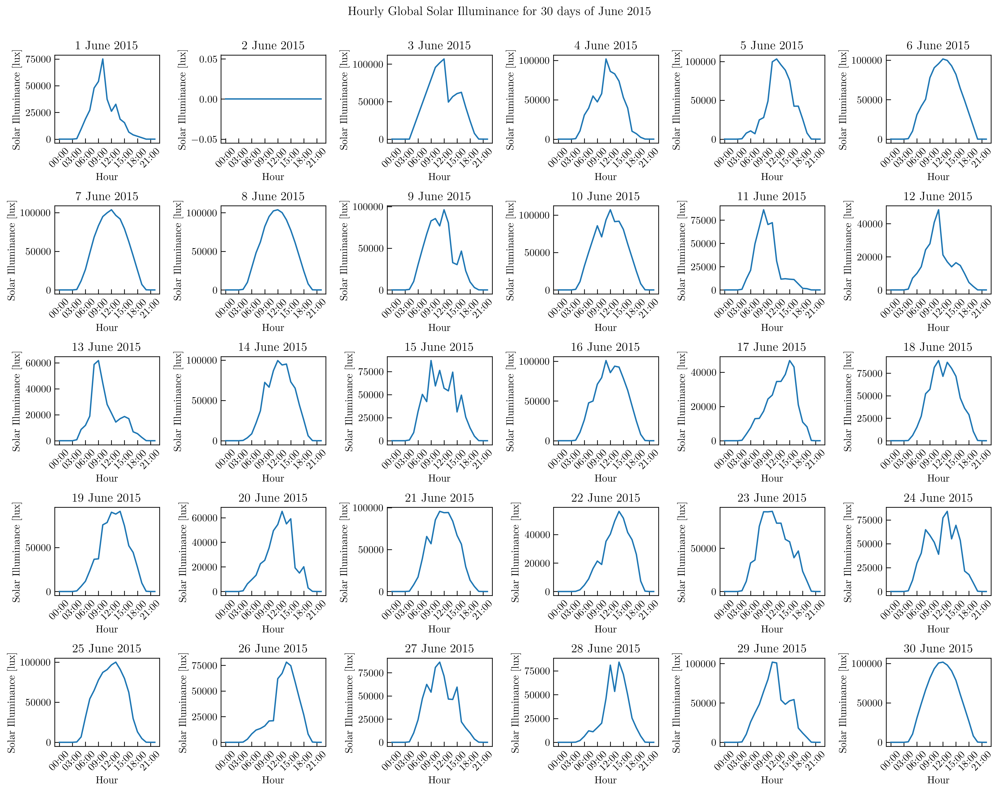

In [9]:
# Define the number of days and hours
num_days = 30
n_rows = 5
n_cols = 6

# Create a 5 by 6 grid of subplots
fig, axs = plt.subplots(n_rows, n_cols, figsize=(15, 12))
fig.suptitle('Hourly Global Solar Illuminance for 30 days of June 2015')

# Iterate through the first 30 days of June and plot the GHI values for each hour
for day in range(num_days):
    df = nested_data[2015][6][day+1]
    axs[day//n_cols, day%n_cols].plot(df['datetime'], df['GHE'])
    axs[day//n_cols, day%n_cols].set_title(f'{day+1} June 2015')
    axs[day//n_cols, day%n_cols].set_xlabel('Hour')
    axs[day//n_cols, day%n_cols].set_ylabel('Solar Illuminance [lux]')
    axs[day//n_cols, day%n_cols].tick_params(axis='x', rotation=45)

    # Format the x-axis tick labels to show only the hour
    axs[day//n_cols, day%n_cols].xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))


# Adjust layout to avoid overlap of titles and labels
plt.tight_layout()
plt.subplots_adjust(top=0.92)
plt.show()


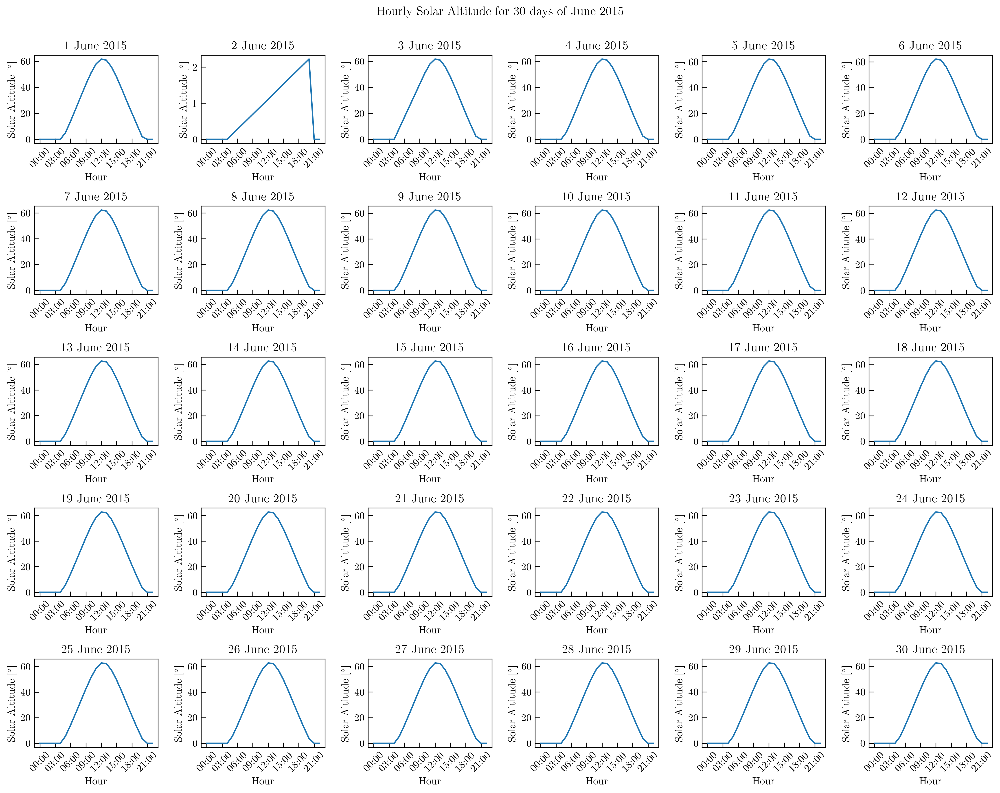

In [10]:
# Define the number of days and hours
num_days = 30
n_rows = 5
n_cols = 6

# Create a 5 by 6 grid of subplots
fig, axs = plt.subplots(n_rows, n_cols, figsize=(15, 12))
fig.suptitle('Hourly Solar Altitude for 30 days of June 2015')

# Iterate through the first 30 days of January and plot the GHI values for each hour
for day in range(num_days):
    df = nested_data[2015][6][day+1]
    axs[day//n_cols, day%n_cols].plot(df['datetime'], df['sol_alt'])
    axs[day//n_cols, day%n_cols].set_title(f'{day+1} June 2015')
    axs[day//n_cols, day%n_cols].set_xlabel('Hour')
    axs[day//n_cols, day%n_cols].set_ylabel('Solar Altitude [$^{\circ}$]')
    axs[day//n_cols, day%n_cols].tick_params(axis='x', rotation=45)

    # Format the x-axis tick labels to show only the hour
    axs[day//n_cols, day%n_cols].xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))


# Adjust layout to avoid overlap of titles and labels
plt.tight_layout()
plt.subplots_adjust(top=0.92)
plt.show()


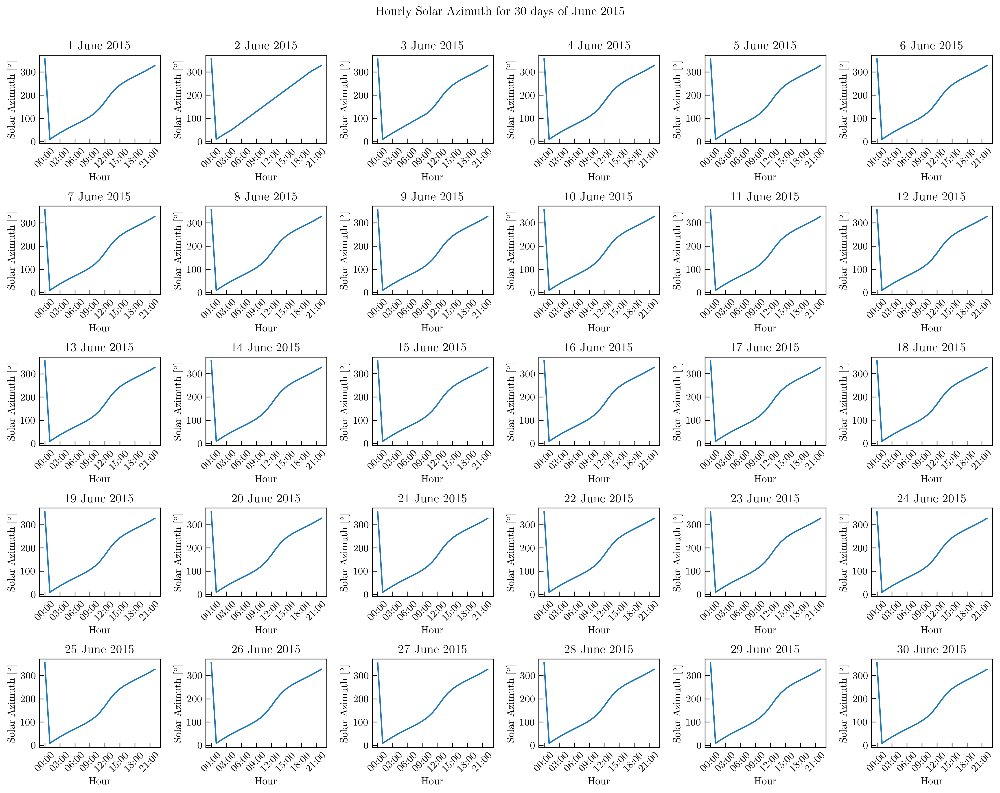

In [11]:
# Define the number of days and hours
num_days = 30
n_rows = 5
n_cols = 6

# Create a 5 by 6 grid of subplots
fig, axs = plt.subplots(n_rows, n_cols, figsize=(15, 12))
fig.suptitle('Hourly Solar Azimuth for 30 days of June 2015')

# Iterate through the first 30 days of January and plot the GHI values for each hour
for day in range(num_days):
    df = nested_data[2015][6][day+1]
    axs[day//n_cols, day%n_cols].plot(df['datetime'], df['sol_az'])
    axs[day//n_cols, day%n_cols].set_title(f'{day+1} June 2015')
    axs[day//n_cols, day%n_cols].set_xlabel('Hour')
    axs[day//n_cols, day%n_cols].set_ylabel('Solar Azimuth [$^{\circ}$]')
    axs[day//n_cols, day%n_cols].tick_params(axis='x', rotation=45)

    # Format the x-axis tick labels to show only the hour
    axs[day//n_cols, day%n_cols].xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))


# Adjust layout to avoid overlap of titles and labels
plt.tight_layout()
plt.subplots_adjust(top=0.92)
plt.show()


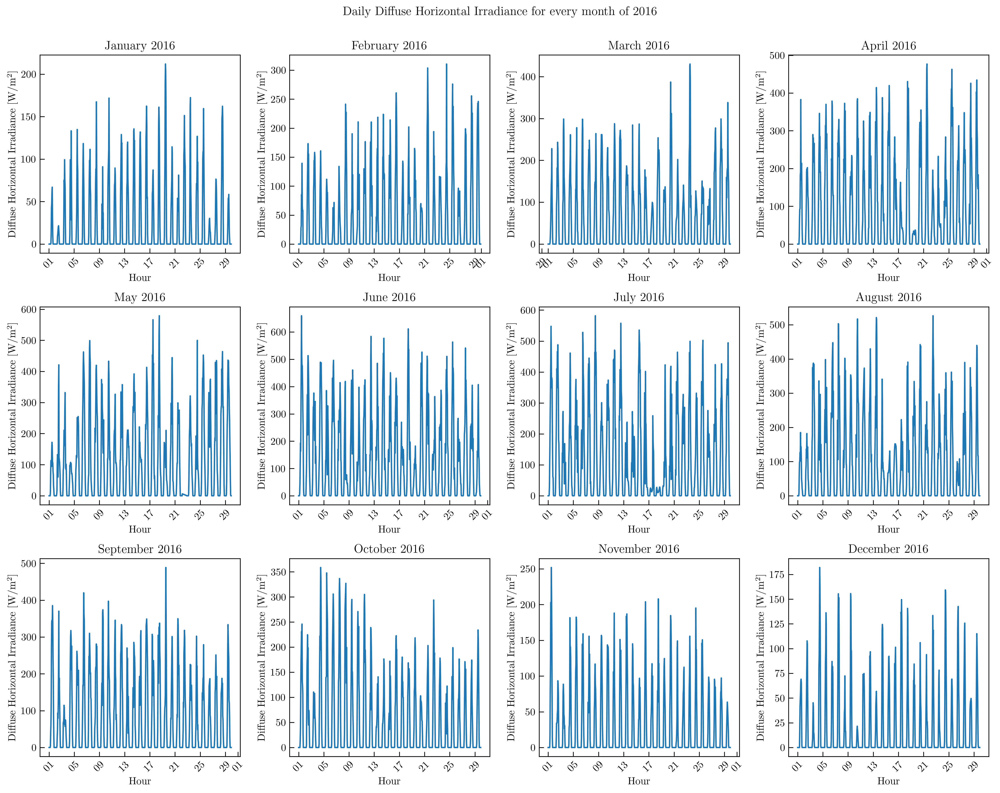

In [12]:
# Define the number of days and hours
num_months = 12
n_rows = 3
n_cols = 4

# Create a 5 by 6 grid of subplots
fig, axs = plt.subplots(n_rows, n_cols, figsize=(15, 12))
fig.suptitle('Daily Diffuse Horizontal Irradiance for every month of 2016')

# Iterate through the first 30 days of January and plot the GHI values for each hour
for month in range(num_months):
    df = pd.concat((nested_data[2016][month+1][day] for day in range(1, 30)))
    axs[month//n_cols, month%n_cols].plot(df['datetime'], df['DHI'])
    axs[month//n_cols, month%n_cols].set_title(f'{months[month]} 2016')
    axs[month//n_cols, month%n_cols].set_xlabel('Hour')
    axs[month//n_cols, month%n_cols].set_ylabel('Diffuse Horizontal Irradiance [W/m$^2$]')
    axs[month//n_cols, month%n_cols].tick_params(axis='x', rotation=45)

    # Format the x-axis tick labels to show only the hour
    axs[month//n_cols, month%n_cols].xaxis.set_major_formatter(mdates.DateFormatter('%d'))


# Adjust layout to avoid overlap of titles and labels
plt.tight_layout()
plt.subplots_adjust(top=0.92)
plt.show()


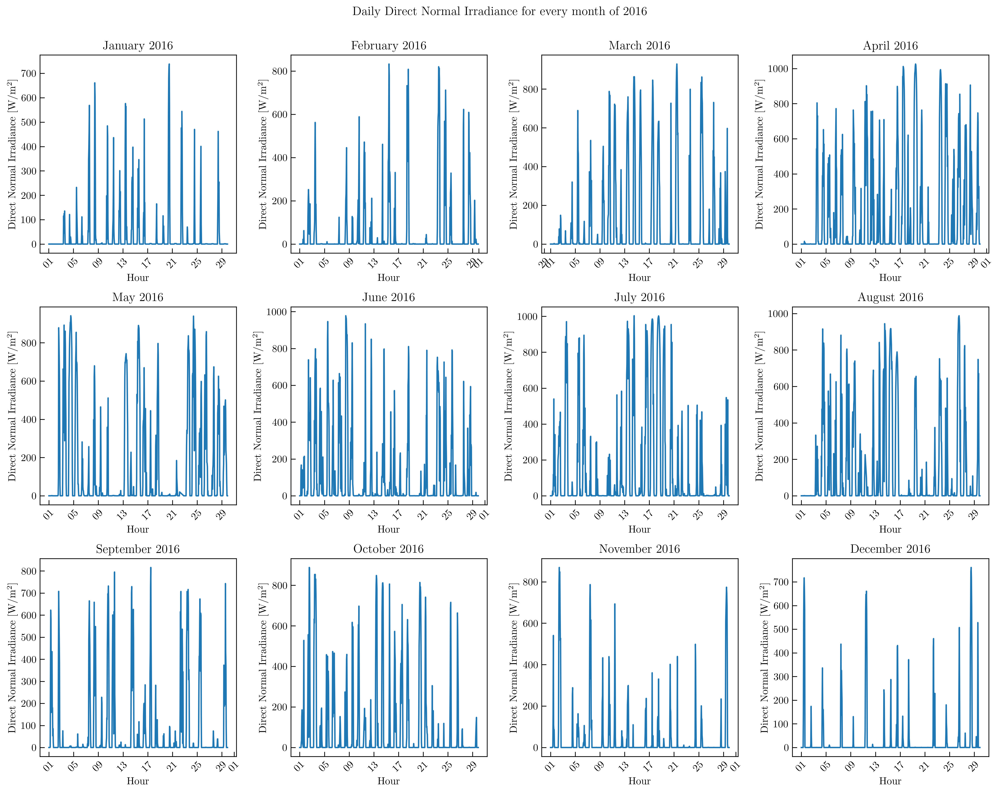

In [13]:
# Define the number of days and hours
num_months = 12
n_rows = 3
n_cols = 4

# Create a 5 by 6 grid of subplots
fig, axs = plt.subplots(n_rows, n_cols, figsize=(15, 12))
fig.suptitle('Daily Direct Normal Irradiance for every month of 2016')

# Iterate through the first 30 days of January and plot the GHI values for each hour
for month in range(num_months):
    df = pd.concat((nested_data[2016][month+1][day] for day in range(1, 30)))
    axs[month//n_cols, month%n_cols].plot(df['datetime'], df['DNI'])
    axs[month//n_cols, month%n_cols].set_title(f'{months[month]} 2016')
    axs[month//n_cols, month%n_cols].set_xlabel('Hour')
    axs[month//n_cols, month%n_cols].set_ylabel('Direct Normal Irradiance [W/m$^2$]')
    axs[month//n_cols, month%n_cols].tick_params(axis='x', rotation=45)

    # Format the x-axis tick labels to show only the hour
    axs[month//n_cols, month%n_cols].xaxis.set_major_formatter(mdates.DateFormatter('%d'))


# Adjust layout to avoid overlap of titles and labels
plt.tight_layout()
plt.subplots_adjust(top=0.92)
plt.show()


### Apply GP for one month's forecasting

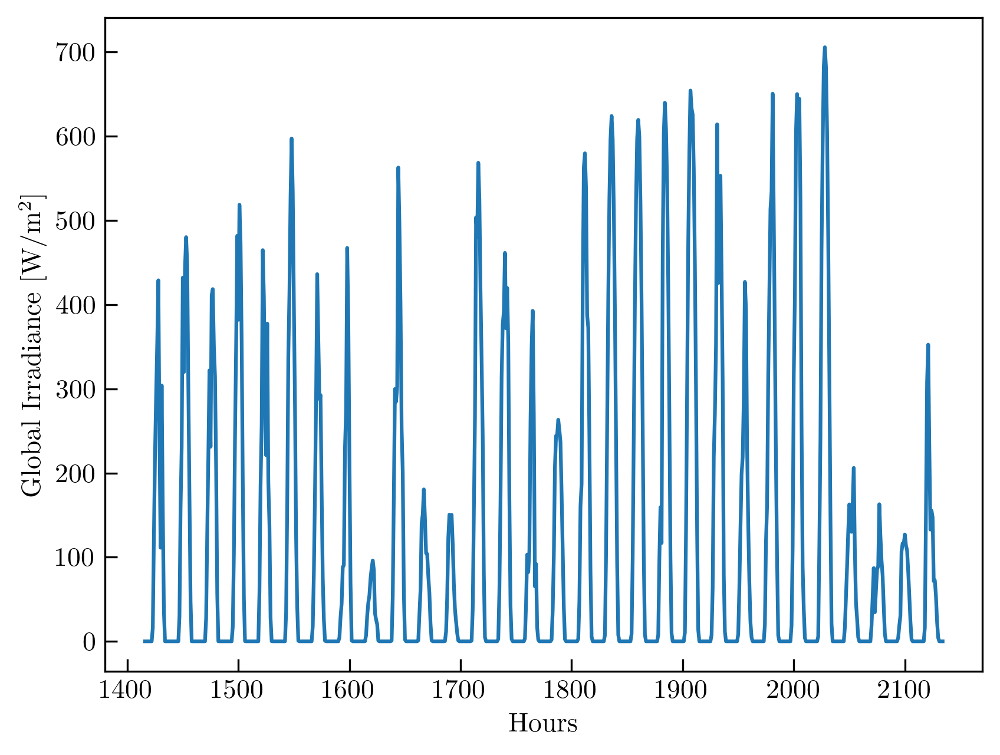

In [14]:
# Choose the year and month of interest
month_key = 3
year_key = 2015

train_data = pd.concat((nested_data[year_key][month_key][day] for day in range(1, 31)))

# Create the DataFrame
# train_data['datetime'] = pd.to_datetime(train_data['datetime'])

# Set the first element to have a value of zero, and the rest as hours passed after the first element
# train_data['hours'] = (train_data['datetime'] - train_data['datetime'].iloc[0]).dt.total_seconds() / 3600

plt.figure()
plt.plot(train_data['hours'], train_data['GHI'])
plt.xlabel('Hours')
plt.ylabel('Global Irradiance [W/m$^2$]')
plt.show()

In [59]:
# train/test split
prop_train = 0.7
n_train = round(prop_train * train_data.shape[0])

# predictors = ["hours"]
# predictors = ["hours", "GHE"]
# predictors = ["hours", "GHE", "sol_alt"]
# predictors = ["hours", "GHE", "sol_alt", "DNI"]
# predictors = ["hours", "sol_alt", "DNI", "DHI"]
# predictors = ["hours", "sol_alt", "sol_az", "GHE", "DNI", "DHI"]
# predictors = ["hours", "GHE", "sol_alt", "sol_az"]
# predictors = ["hours", "GHE", "cld_ttl_amt_id"]
predictors = ["hours", "GHE", "sol_alt", "sol_az", "cld_ttl_amt_id"]

X = train_data[predictors].values

# y = train_data['GHI'].values
# y = train_data['DHI'].values
y = train_data['DNI'].values

X_train = X[:n_train]
y_train = y[:n_train][:, np.newaxis]

X_test = X[n_train:]
y_test = y[n_train:]


xScaler = StandardScaler()
yScaler = StandardScaler()
y_train_scaled = yScaler.fit_transform(y_train)
X_train_scaled = xScaler.fit_transform(X_train)

k0 = WhiteKernel(noise_level=0.1**2, noise_level_bounds=(1e-50, 1e10))

k1 = ConstantKernel(constant_value=1.0, constant_value_bounds=(1e-10, 1e10)) \
   * ExpSineSquared(length_scale=1.0, length_scale_bounds=(1e-10, 1e10), periodicity=100.)
   
# long_term_trend_kernel = ConstantKernel(constant_value=50.0, constant_value_bounds=(1e-20, 1e20)) * RBF(length_scale=50.0, length_scale_bounds=(1e-20, 1e20))
# long_term_trend_kernel = ConstantKernel(constant_value=50.0, constant_value_bounds=(1e-20, 1e20))
nonlinear_kernel = ConstantKernel(constant_value=50.0, constant_value_bounds=(1e-20, 1e20)) * Matern(length_scale=1.0, nu=2.5)
seasonal_kernel = ConstantKernel(constant_value=20.0, constant_value_bounds=(1e-20, 1e20)) * ExpSineSquared(length_scale=1.0, periodicity=1.0, length_scale_bounds=(1e-20, 1e20))
noise_kernel = WhiteKernel(noise_level=0.1**2, noise_level_bounds=(1e-50, 1e50))

# kernel = long_term_trend_kernel + seasonal_kernel + noise_kernel
kernel = nonlinear_kernel + seasonal_kernel + noise_kernel

# kernel = k0 + k1
gpr = GaussianProcessRegressor(kernel=kernel, alpha=1., n_restarts_optimizer=10)

# Train the GPR model on the training data
gpr.fit(X_train_scaled, y_train_scaled)

# Make predictions
y_pred, y_std = gpr.predict(xScaler.transform(X), return_std=True)

r2score = gpr.score(X=xScaler.transform(X), y=yScaler.transform(y[:, np.newaxis]))
rmse = mean_squared_error(y, yScaler.inverse_transform(y_pred[:, np.newaxis]).squeeze(), squared=False)
# nrmse = ((yScaler.inverse_transform(y_pred[:, np.newaxis]).squeeze() - y)**2).sum() / (y.size * (y ** 2).sum())
nrmse = rmse / (np.abs(y.max() - y.min()))

print(gpr.kernel_.k1)
print(gpr.kernel_.k2)

print("When using a GAUSSIAN PROCESS")
print(f"R2 score: {r2score:.3f}")
print(f"Root Mean Squared Error: {rmse:.3f}")
print(f"Normalized Root Mean Squared Error: {nrmse:.6f}")

c:\Users\Mr. Christos\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-50. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


3.7**2 * Matern(length_scale=9.58, nu=2.5) + 0.00347**2 * ExpSineSquared(length_scale=3.21e+13, periodicity=1.5)
WhiteKernel(noise_level=1e-50)
When using a GAUSSIAN PROCESS
R2 score: 0.895
Root Mean Squared Error: 68.995
Normalized Root Mean Squared Error: 0.079469


### Linear Regression

In [60]:
# X_lin = train_data["GHE"].values[:, np.newaxis]
# y_lin = train_data['GHI'].values
X_lin = train_data[predictors].values
# y_lin = train_data['DHI'].values
y_lin = train_data['DNI'].values

X_train_lin = X_lin[:n_train]
y_train_lin = y_lin[:n_train]

reg = LinearRegression().fit(X_train_lin, y_train_lin)
lin_pred = reg.predict(X_lin)

r2score = reg.score(X_lin, y_lin)
rmse = mean_squared_error(y_lin, lin_pred, squared=False)
# nrmse = ((lin_pred - y_lin)**2).sum() / (lin_pred.size * (y_lin ** 2).sum())
nrmse = rmse / (np.abs(lin_pred.max() - lin_pred.min()))

print("When using LINEAR REGRESSION")
print(f"R2 score: {r2score:.3f}")
print(f"Mean Squared Error: {rmse:.3f}")
print(f"Normalized Root Mean Squared Error: {nrmse:.6f}")

When using LINEAR REGRESSION
R2 score: 0.834
Mean Squared Error: 86.702
Normalized Root Mean Squared Error: 0.090380


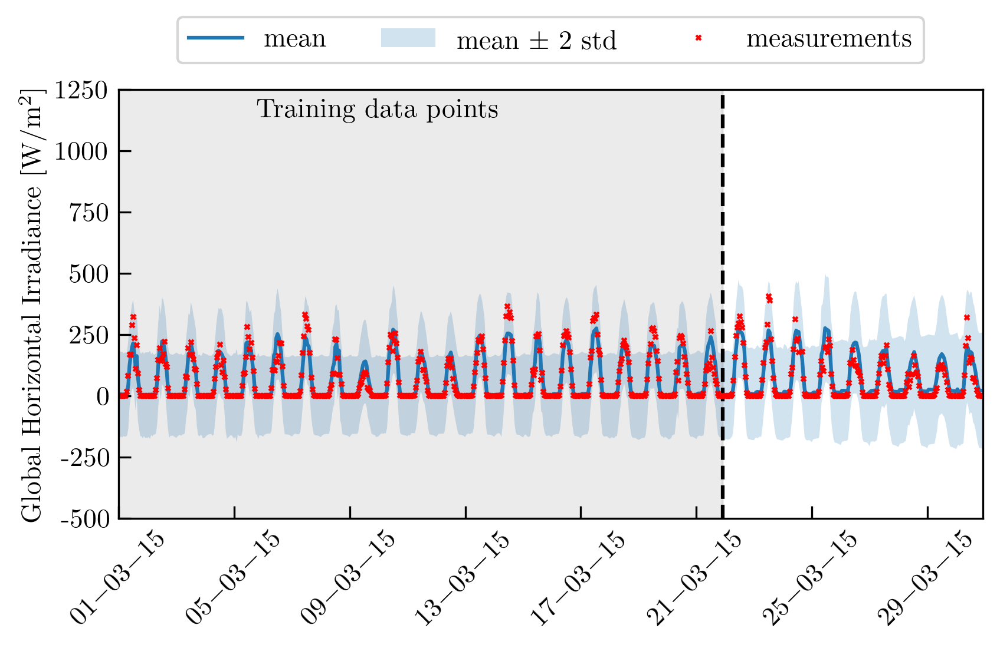

In [18]:
dates = train_data["datetime"].values
plt.figure(figsize=(16*cm,8*cm))
plt.plot(dates, yScaler.inverse_transform(y_pred[:, np.newaxis]).squeeze(), label="mean")
plt.fill_between(dates,
                 yScaler.inverse_transform(y_pred[:, np.newaxis]).squeeze() + 2 * yScaler.inverse_transform(y_std[:, np.newaxis]).squeeze(),
                 yScaler.inverse_transform(y_pred[:, np.newaxis]).squeeze() - 2 * yScaler.inverse_transform(y_std[:, np.newaxis]).squeeze(), 
                 alpha=0.2, 
                 label=r'mean $\pm$ 2 std')
plt.axvspan(dates[0], dates[n_train], alpha=0.08, color='k')
plt.axvline(dates[n_train], linestyle='--', c='k')
# plt.plot(dates, lin_pred, label="Linear Regression")
plt.plot(dates, y, 'rx', markersize=2., label='measurements')

plt.ylabel('Global Horizontal Irradiance [W/m$^2$]')
# plt.ylabel('Diffuse Horizontal Irradiance [W/m$^2$]')
# plt.ylabel('Direct Normal Irradiance [W/m$^2$]')
plt.xlim((dates[0], dates[-1]))
plt.legend(fontsize=fsize, loc='upper center', bbox_to_anchor=(0.5, 1.2), ncols=3)
ax = plt.gca()
ax.tick_params(axis='x', rotation=45)
ax.xaxis.set_major_formatter(mdates.DateFormatter('%d-%m-%y'))
# ax.set_yticks(np.arange(-750, 1751, 500),np.arange(-750, 1751, 500))
ax.set_yticks(np.arange(-500, 1251, 250),np.arange(-500, 1251, 250))
plt.ylim((-500, 1250))

plt.text(0.3, 0.95, "Training data points", horizontalalignment='center', verticalalignment='center', transform = ax.transAxes)
# plt.text(0.86, 0.95, "Forecasting", horizontalalignment='center', verticalalignment='center', transform = ax.transAxes)

# plt.savefig("monthForecastGHI_morePredictors.png",bbox_inches='tight')

plt.show()

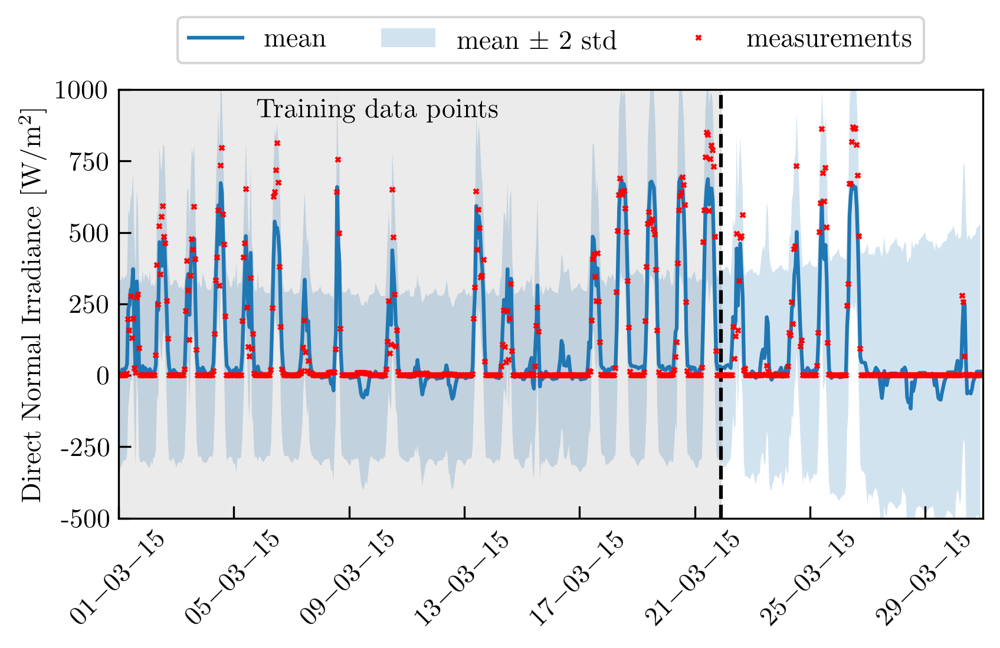

In [61]:
dates = train_data["datetime"].values
plt.figure(figsize=(16*cm,8*cm))
plt.plot(dates, yScaler.inverse_transform(y_pred[:, np.newaxis]).squeeze(), label="mean")
plt.fill_between(dates,
                 yScaler.inverse_transform(y_pred[:, np.newaxis]).squeeze() + 2 * yScaler.inverse_transform(y_std[:, np.newaxis]).squeeze(),
                 yScaler.inverse_transform(y_pred[:, np.newaxis]).squeeze() - 2 * yScaler.inverse_transform(y_std[:, np.newaxis]).squeeze(), 
                 alpha=0.2, 
                 label=r'mean $\pm$ 2 std')
plt.axvspan(dates[0], dates[n_train], alpha=0.08, color='k')
plt.axvline(dates[n_train], linestyle='--', c='k')
# plt.plot(dates, lin_pred, label="Linear Regression")
plt.plot(dates, y, 'rx', markersize=2., label='measurements')

# plt.ylabel('Global Horizontal Irradiance [W/m$^2$]')
# plt.ylabel('Diffuse Horizontal Irradiance [W/m$^2$]')
plt.ylabel('Direct Normal Irradiance [W/m$^2$]')
plt.xlim((dates[0], dates[-1]))
plt.legend(fontsize=fsize, loc='upper center', bbox_to_anchor=(0.5, 1.2), ncols=3)
ax = plt.gca()
ax.tick_params(axis='x', rotation=45)
ax.xaxis.set_major_formatter(mdates.DateFormatter('%d-%m-%y'))
# ax.set_yticks(np.arange(-750, 1751, 500),np.arange(-750, 1751, 500))
ax.set_yticks(np.arange(-500, 1251, 250),np.arange(-500, 1251, 250))
# plt.ylim((-250, 500))
plt.ylim((-500, 1000))
plt.xlim([datetime.date(2015, 3, 1), datetime.date(2015, 3, 31)])

plt.text(0.3, 0.95, "Training data points", horizontalalignment='center', verticalalignment='center', transform = ax.transAxes)
# plt.text(0.86, 0.95, "Forecasting", horizontalalignment='center', verticalalignment='center', transform = ax.transAxes)

# plt.savefig("monthForecastDNI.png",bbox_inches='tight')
plt.savefig("monthForecastDNI_morepredictors.png",bbox_inches='tight')

plt.show()

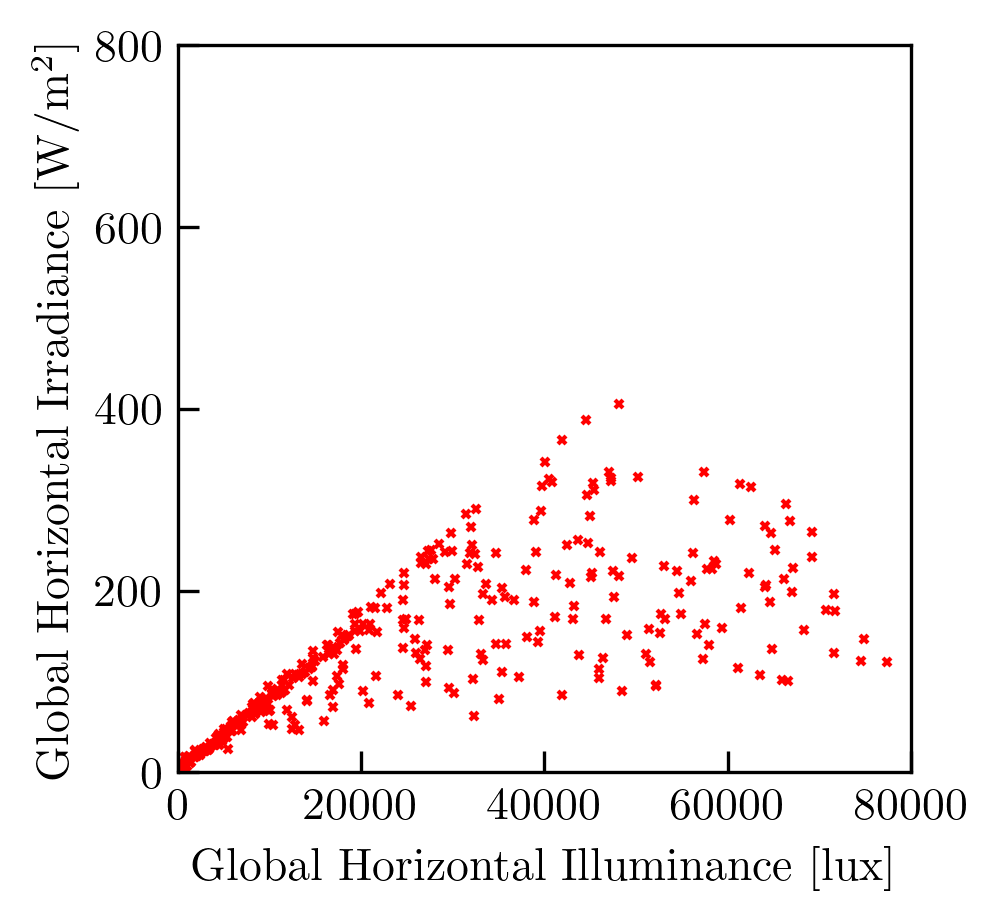

In [23]:
plotX = X_lin[:,1].squeeze()
plotY = y_lin

plt.figure(figsize=(8*cm,8*cm))
plt.plot(plotX, plotY, 'rx', markersize=2., label="mean")

plt.xlabel('Global Horizontal Illuminance [lux]')
plt.ylabel('Global Horizontal Irradiance [W/m$^2$]')

ax = plt.gca()
ax.set_xticks(np.arange(0, 80001, 20000),np.arange(0, 80001, 20000))
ax.set_yticks(np.arange(0, 801, 200),np.arange(0, 801, 200))

plt.xlim((0, 80000))
plt.ylim((0, 800))

# plt.savefig("measurementLinearPlot.png",bbox_inches='tight')

plt.show()

### Train GP on sunniest and least sunny months of 2015, and forecast for whole 2016

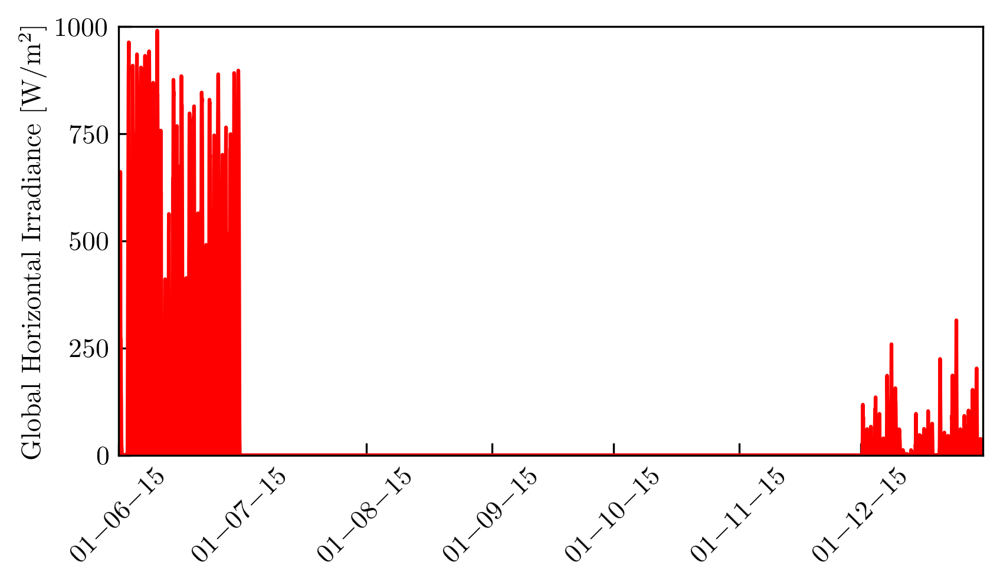

In [15]:
four_month_data = pd.concat((pd.concat((nested_data[2015][month][day] for day in range(1, 31))) for month in (3, 6, 9, 12)))
two_month_data = pd.concat((pd.concat((nested_data[2015][month][day] for day in range(1, 31))) for month in (6, 12)))
one_month_data = pd.concat((pd.concat((nested_data[2015][month][day] for day in range(1, 31))) for month in (12,)))

# Create the DataFrame
# two_month_data['datetime'] = pd.to_datetime(two_month_data['datetime'])
# one_month_data['datetime'] = pd.to_datetime(one_month_data['datetime'])
# four_month_data['datetime'] = pd.to_datetime(four_month_data['datetime'])

# # Set the first element to have a value of zero, and the rest as hours passed after the first element
# two_month_data['hours'] = (two_month_data['datetime'] - two_month_data['datetime'].iloc[0]).dt.total_seconds() / 3600
# one_month_data['hours'] = (one_month_data['datetime'] - one_month_data['datetime'].iloc[0]).dt.total_seconds() / 3600
# four_month_data['hours'] = (four_month_data['datetime'] - four_month_data['datetime'].iloc[0]).dt.total_seconds() / 3600

plt.figure(figsize=(16*cm,8*cm))
test_dates = two_month_data["datetime"].values
plt.plot(test_dates, two_month_data['GHI'], c='r')

plt.ylabel('Global Horizontal Irradiance [W/m$^2$]')

ax = plt.gca()
ax.tick_params(axis='x', rotation=45)
ax.xaxis.set_major_formatter(mdates.DateFormatter('%d-%m-%y'))

ax.set_yticks(np.arange(0, 1001, 250),np.arange(0, 1001, 250))
plt.ylim((0, 1000))
plt.xlim([datetime.date(2015, 6, 1), datetime.date(2015, 12, 31)])

plt.savefig("trainData2015.png",bbox_inches='tight')

plt.show()


### GP without constraints

In [16]:
# predictors = ["hours"]
# predictors = ["hours", "GHE"]
# predictors = ["hours", "GHE", "sol_alt"]
# predictors = ["hours", "GHE", "sol_alt", "sol_az"]
# predictors = ["hours", "GHE", "cld_ttl_amt_id"]
predictors = ["hours", "GHE", "sol_alt", "sol_az", "cld_ttl_amt_id"]

# targets = ["GHI"]
targets = ["DHI"]
# targets = ["DHI", "DNI"]

X = two_month_data[predictors].values
y = two_month_data[targets].values

X_train = X
y_train = y

xScaler = StandardScaler()
yScaler = StandardScaler()
y_train_scaled = yScaler.fit_transform(y_train)
X_train_scaled = xScaler.fit_transform(X_train)

k0 = WhiteKernel(noise_level=0.1**2, noise_level_bounds=(1e-50, 1e10))

k1 = ConstantKernel(constant_value=1.0, constant_value_bounds=(1e-10, 1e10)) \
   * ExpSineSquared(length_scale=1.0, length_scale_bounds=(1e-10, 1e10), periodicity=24)
   
# kernel = k0 + k1

nonlinear_kernel = ConstantKernel(constant_value=50.0, constant_value_bounds=(1e-20, 1e20)) * Matern(length_scale=1.0, nu=2.5)
seasonal_kernel = ConstantKernel(constant_value=20.0, constant_value_bounds=(1e-20, 1e20)) * ExpSineSquared(length_scale=1.0, periodicity=1.0, length_scale_bounds=(1e-20, 1e20))
noise_kernel = WhiteKernel(noise_level=0.1**2, noise_level_bounds=(1e-50, 1e50))

kernel = nonlinear_kernel + seasonal_kernel + noise_kernel

gpr = GaussianProcessRegressor(kernel=kernel, alpha=1., n_restarts_optimizer=10)

# Train the GPR model on the training data
gpr.fit(X_train_scaled, y_train_scaled)

c:\Users\Mr. Christos\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__constant_value is close to the specified lower bound 1e-20. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
c:\Users\Mr. Christos\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


GaussianProcessRegressor(alpha=1.0,
                         kernel=7.07**2 * Matern(length_scale=1, nu=2.5) + 4.47**2 * ExpSineSquared(length_scale=1, periodicity=1) + WhiteKernel(noise_level=0.01),
                         n_restarts_optimizer=10)

In [20]:
print(X_train.shape)
print(y_train.shape)

(1325, 5)
(1325, 1)


### Single month (of 2016) plotting

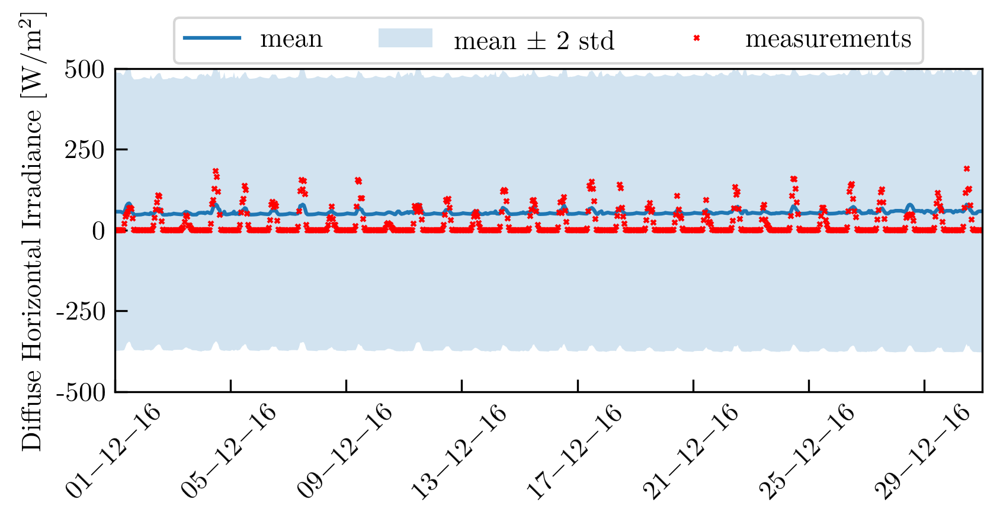

In [17]:
single_month = 12

test_data = pd.concat((nested_data[2016][single_month][day] for day in range(1, 32)))

# Create the DataFrame
# test_data['datetime'] = pd.to_datetime(test_data['datetime'])

# Set the first element to have a value of zero, and the rest as hours passed after the first element
# test_data['hours'] = (test_data['datetime'] - test_data['datetime'].iloc[0]).dt.total_seconds() / 3600

test_X = test_data[predictors].values
test_y = test_data[targets].values

y_pred_test, y_std_test = gpr.predict(xScaler.transform(test_X), return_std=True)

if y_pred_test.ndim == 1:
    y_pred_rescale = yScaler.inverse_transform(y_pred_test.reshape(-1, 1))
    y_std_rescale = yScaler.inverse_transform(y_std_test.reshape(-1, 1))
elif y_pred_test.ndim == 2:
    y_pred_rescale = yScaler.inverse_transform(y_pred_test)
    y_std_rescale = yScaler.inverse_transform(y_std_test)

test_dates = test_data["datetime"].values

plt.figure(figsize=(16*cm,6*cm))
plt.plot(test_dates, y_pred_rescale[:, 0], label="mean")
plt.fill_between(test_dates,
                 y_pred_rescale[:, 0] + 2 * y_std_rescale[:, 0], 
                 y_pred_rescale[:, 0] - 2 * y_std_rescale[:, 0], 
                 alpha=0.2, 
                 label=r'mean $\pm$ 2 std')
plt.plot(test_dates, test_y[:, 0], 'rx', markersize=2., label='measurements')
# plt.ylabel('Global Horizontal Irradiance [W/m$^2$]')
plt.ylabel('Diffuse Horizontal Irradiance [W/m$^2$]')
plt.legend(fontsize=fsize, loc='upper center', bbox_to_anchor=(0.5, 1.2), ncols=3)
plt.xlim((test_dates[0], test_dates[-1]))

ax = plt.gca()
ax.tick_params(axis='x', rotation=45)
ax.xaxis.set_major_formatter(mdates.DateFormatter('%d-%m-%y'))
ax.set_yticks(np.arange(-750, 1001, 250),np.arange(-750, 1001, 250))
# plt.ylim((-250, 500))
# plt.ylim((-250, 500))
plt.ylim((-500, 500))
# plt.xlim([datetime.date(2016, 3, 1), datetime.date(2016, 3, 31)])
# plt.xlim([datetime.date(2016, 6, 1), datetime.date(2016, 6, 30)])
# plt.xlim([datetime.date(2016, 9, 1), datetime.date(2016, 9, 30)])
plt.xlim([datetime.date(2016, 12, 1), datetime.date(2016, 12, 31)])

plt.savefig("yearPredsDecember_DHI_morePredictors.png",bbox_inches='tight')

plt.show()

### Calculate metrics

In [33]:
r2score = gpr.score(X=xScaler.transform(test_X), y=yScaler.transform(test_y))
mse = mean_squared_error(test_y.squeeze(), yScaler.inverse_transform(y_pred_test[:, np.newaxis]).squeeze())
nrmse = ((yScaler.inverse_transform(y_pred_test[:, np.newaxis]).squeeze() - test_y.squeeze())**2).sum() / (test_y.squeeze() ** 2).sum()

print(f"R2 score: {r2score:.3f}")
print(f"Mean Squared Error: {mse:.3f}")
print(f"Normalized Root Mean Squared Error: {nrmse:.6f}")

R2 score: 0.994
Mean Squared Error: 17.751
Normalized Root Mean Squared Error: 0.004818


### Whole 2016 forecasting

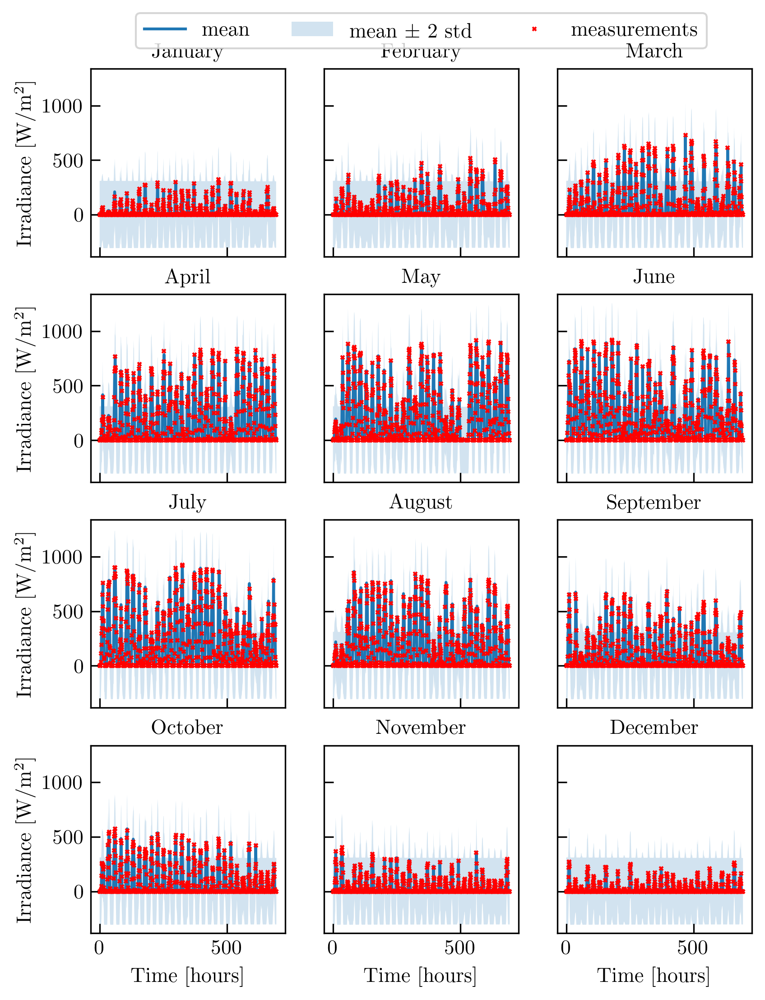

In [34]:
# Define the number of days and hours
num_months = 12
n_rows = 4
n_cols = 3

# Create a 5 by 6 grid of subplots
fig, axs = plt.subplots(n_rows, n_cols, figsize=(16*cm, 20*cm), sharey=True, sharex=True)
# fig.suptitle('Forecasting on 2016', fontsize=2*fsize)



for month in range(num_months):
    test_data = pd.concat((nested_data[2016][month+1][day] for day in range(1, 30)))

    # Create the DataFrame
    test_data['datetime'] = pd.to_datetime(test_data['datetime'])

    # Set the first element to have a value of zero, and the rest as hours passed after the first element
    test_data['hours'] = (test_data['datetime'] - test_data['datetime'].iloc[0]).dt.total_seconds() / 3600

    test_X = test_data[predictors].values
    test_y = test_data[targets].values

    y_pred_test, y_std_test = gpr.predict(xScaler.transform(test_X), return_std=True)
    
    if y_pred_test.ndim == 1:
        y_pred_rescale = yScaler.inverse_transform(y_pred_test.reshape(-1, 1))
        y_std_rescale = yScaler.inverse_transform(y_std_test.reshape(-1, 1))
    elif y_pred_test.ndim == 2:
        y_pred_rescale = yScaler.inverse_transform(y_pred_test)
        y_std_rescale = yScaler.inverse_transform(y_std_test)

    test_dates = np.array(test_X[:, 0], dtype=float)
    
    axs[month//n_cols, month%n_cols].plot(test_dates, y_pred_rescale[:, 0], label="mean")
    axs[month//n_cols, month%n_cols].fill_between(test_dates,
                                                  y_pred_rescale[:, 0] + 2 * y_std_rescale[:, 0], 
                                                  y_pred_rescale[:, 0] - 2 * y_std_rescale[:, 0], 
                                                  alpha=0.2, 
                                                  label=r'mean $\pm$ 2 std')
    axs[month//n_cols, month%n_cols].plot(test_dates, test_y[:, 0], 'rx', markersize=2., label='measurements')
    axs[month//n_cols, month%n_cols].title.set_text(months[month])
    axs[month//n_cols, month%n_cols].title.set_size(fsize)

axs[0, 0].set_ylabel('Irradiance [W/m$^2$]')
axs[1, 0].set_ylabel('Irradiance [W/m$^2$]')
axs[2, 0].set_ylabel('Irradiance [W/m$^2$]')
axs[3, 0].set_ylabel('Irradiance [W/m$^2$]')
axs[3, 0].set_xlabel('Time [hours]')
axs[3, 1].set_xlabel('Time [hours]')
axs[3, 2].set_xlabel('Time [hours]')

# Adjust layout to avoid overlap of titles and labels
axs[0, 1].legend(fontsize=fsize, loc='upper center', bbox_to_anchor=(0.5, 1.35), ncols=3)
plt.subplots_adjust(top=0.92)

# plt.savefig("whole2016.png",bbox_inches='tight')

plt.show()


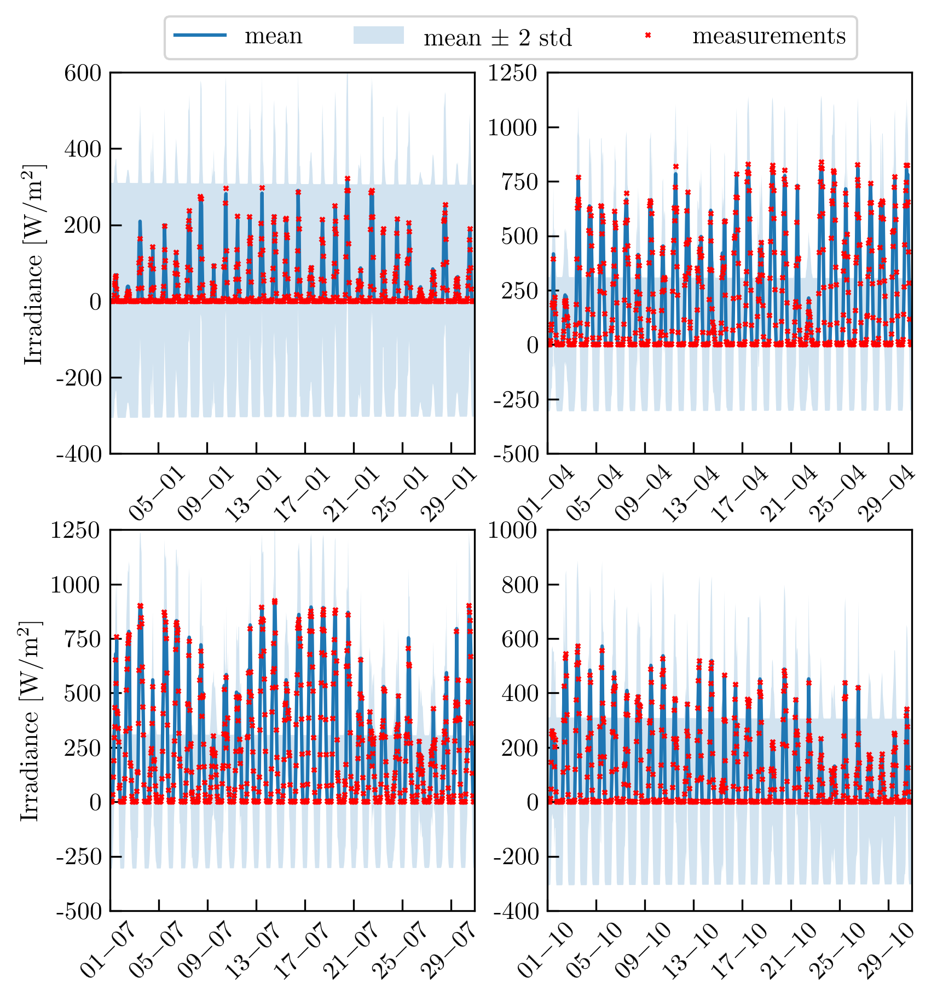

In [27]:
# Define the number of days and hours
num_months = 4
n_rows = 2
n_cols = 2

# Create a 5 by 6 grid of subplots
fig, axs = plt.subplots(n_rows, n_cols, figsize=(16*cm, 16*cm))

for month in range(num_months):
    test_data = pd.concat((nested_data[2016][month * (len(months) // num_months) +1][day] for day in range(1, 31)))

    # Create the DataFrame
    test_data['datetime'] = pd.to_datetime(test_data['datetime'])

    # Set the first element to have a value of zero, and the rest as hours passed after the first element
    test_data['hours'] = (test_data['datetime'] - test_data['datetime'].iloc[0]).dt.total_seconds() / 3600

    test_X = test_data[predictors].values
    test_y = test_data[targets].values

    y_pred_test, y_std_test = gpr.predict(xScaler.transform(test_X), return_std=True)
    
    if y_pred_test.ndim == 1:
        y_pred_rescale = yScaler.inverse_transform(y_pred_test.reshape(-1, 1))
        y_std_rescale = yScaler.inverse_transform(y_std_test.reshape(-1, 1))
    elif y_pred_test.ndim == 2:
        y_pred_rescale = yScaler.inverse_transform(y_pred_test)
        y_std_rescale = yScaler.inverse_transform(y_std_test)

    test_dates = np.array(test_X[:, 0], dtype=float)
    test_dates = test_data["datetime"].values
    axs[month//n_cols, month%n_cols].plot(test_dates, y_pred_rescale[:, 0], label="mean")
    axs[month//n_cols, month%n_cols].fill_between(test_dates,
                                                  y_pred_rescale[:, 0] + 2 * y_std_rescale[:, 0], 
                                                  y_pred_rescale[:, 0] - 2 * y_std_rescale[:, 0], 
                                                  alpha=0.2, 
                                                  label=r'mean $\pm$ 2 std')
    axs[month//n_cols, month%n_cols].plot(test_dates, test_y[:, 0], 'rx', markersize=2., label='measurements')
    axs[month//n_cols, month%n_cols].set_xlim((test_dates[0], test_dates[-1]))
    axs[month//n_cols, month%n_cols].tick_params(axis='x', rotation=45)
    axs[month//n_cols, month%n_cols].xaxis.set_major_formatter(mdates.DateFormatter('%d-%m'))
    axs[month//n_cols, month%n_cols].title.set_size(fsize)

axs[0, 0].set_ylabel('Irradiance [W/m$^2$]')
axs[1, 0].set_ylabel('Irradiance [W/m$^2$]')

axs[0,0].set_yticks(np.arange(-400, 601, 200),np.arange(-400, 601, 200))
axs[0,0].set_ylim((-400, 600))
axs[0,1].set_yticks(np.arange(-500, 1251, 250),np.arange(-500, 1251, 250))
axs[0,1].set_ylim((-500, 1250))
axs[1,0].set_yticks(np.arange(-500, 1251, 250),np.arange(-500, 1251, 250))
axs[1,0].set_ylim((-500, 1250))
axs[1,1].set_yticks(np.arange(-400, 1001, 200),np.arange(-400, 1001, 200))
axs[1,1].set_ylim((-400, 1000))

# Adjust layout to avoid overlap of titles and labels
axs[0, 1].legend(fontsize=fsize, loc='upper center', bbox_to_anchor=(-0.1, 1.18), ncols=3)
plt.subplots_adjust(top=0.92)

# plt.savefig("whole2016.png",bbox_inches='tight')

plt.show()


### GP yearly forecasting error 

In [28]:
whole2016data = pd.concat((pd.concat((nested_data[2016][month][day] for day in range(1, 30))) for month in range(1, 13)))

whole2016data['datetime'] = pd.to_datetime(whole2016data['datetime'])

# Set the first element to have a value of zero, and the rest as hours passed after the first element
whole2016data['hours'] = (whole2016data['datetime'] - whole2016data['datetime'].iloc[0]).dt.total_seconds() / 3600

test_X = whole2016data[predictors].values
test_y = whole2016data[targets].values

y_pred_test, y_std_test = gpr.predict(xScaler.transform(test_X), return_std=True)

r2score = gpr.score(X=xScaler.transform(test_X), y=yScaler.transform(test_y))
mse = mean_squared_error(test_y, y_pred_test)
nrmse = ((y_pred_test - test_y.squeeze())**2).sum() / (test_y.squeeze() ** 2).sum()

print(f"R2 score: {r2score:.3f}")
print(f"Mean Squared Error: {mse:.3f}")
print(f"Normalized Root Mean Squared Error: {nrmse:.6f}")

R2 score: 0.998
Mean Squared Error: 55697.321
Normalized Root Mean Squared Error: 0.994474


### Correlation between Irradiance and Illuminance per month

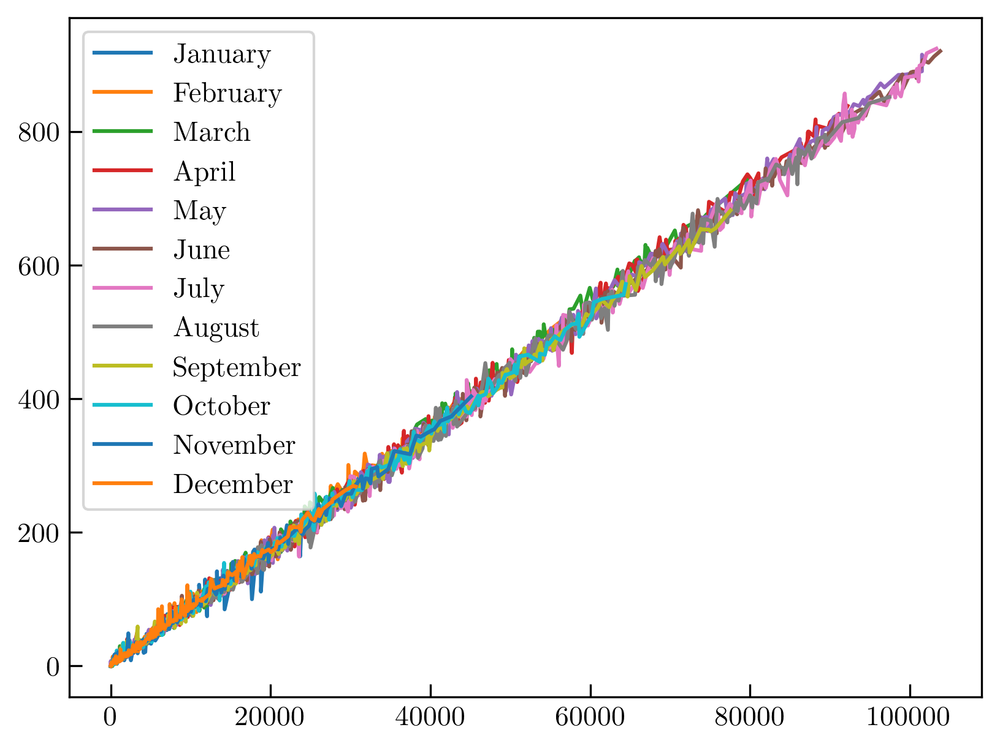

,Month,Max Illum,Slope,Intercept
0,January,35827.5,0.008855,0.096803
1,February,56571.666667,0.008966,-0.330376
2,March,79824.166667,0.009075,-0.747619
3,April,92200.0,0.008964,-0.82585
4,May,101957.5,0.008916,-1.306297
5,June,103788.333333,0.008821,-1.064816
6,July,103312.5,0.008759,-0.875411
7,August,97424.166667,0.008768,-0.759638
8,September,77557.5,0.00871,-0.551792
9,October,64445.0,0.008761,0.600284


In [29]:
monthData = {'Month': months,
             'Max Illum': np.zeros_like(months),
             'Slope': np.zeros_like(months),
             'Intercept': np.zeros_like(months)}

monthlyIllumIrrad = pd.DataFrame(monthData)

plt.figure()
for month_i, month in enumerate(months):
    tempDf = pd.concat((nested_data[2016][month_i + 1][day] for day in range(1, 30)))
    illum = tempDf['GHE'].values
    irrad = tempDf['GHI'].values
    reg = LinearRegression().fit(illum[:, np.newaxis], irrad)
    monthlyIllumIrrad.iloc[month_i, 1:] = np.array([illum.max(), reg.coef_.item(), reg.intercept_])
    sortInds = illum.argsort(axis=0)
    illum = illum[sortInds]
    irrad = irrad[sortInds]
    plt.plot(illum, irrad, label=month)
plt.legend(fontsize=fsize)
plt.show()

monthlyIllumIrrad

### Linear regression trained on limited months

In [30]:
illum = two_month_data['GHE'].values
irrad = two_month_data['GHI'].values
reg = LinearRegression().fit(illum[:, np.newaxis], irrad)

lin_pred = reg.predict(whole2016data["GHE"].values[:, np.newaxis])

r2score = reg.score(whole2016data["GHE"].values[:, np.newaxis], whole2016data["GHI"].values[:, np.newaxis])
mse = mean_squared_error(whole2016data["GHI"].values.squeeze(), lin_pred)
nrmse = ((lin_pred - whole2016data["GHI"].values.squeeze())**2).sum() / (whole2016data["GHI"].values.squeeze() ** 2).sum()

print(f"R2 score: {r2score:.3f}")   
print(f"Mean Squared Error: {mse:.3f}")
print(f"Normalized Root Mean Squared Error: {nrmse:.6f}")

R2 score: 0.998
Mean Squared Error: 62.860
Normalized Root Mean Squared Error: 0.001122


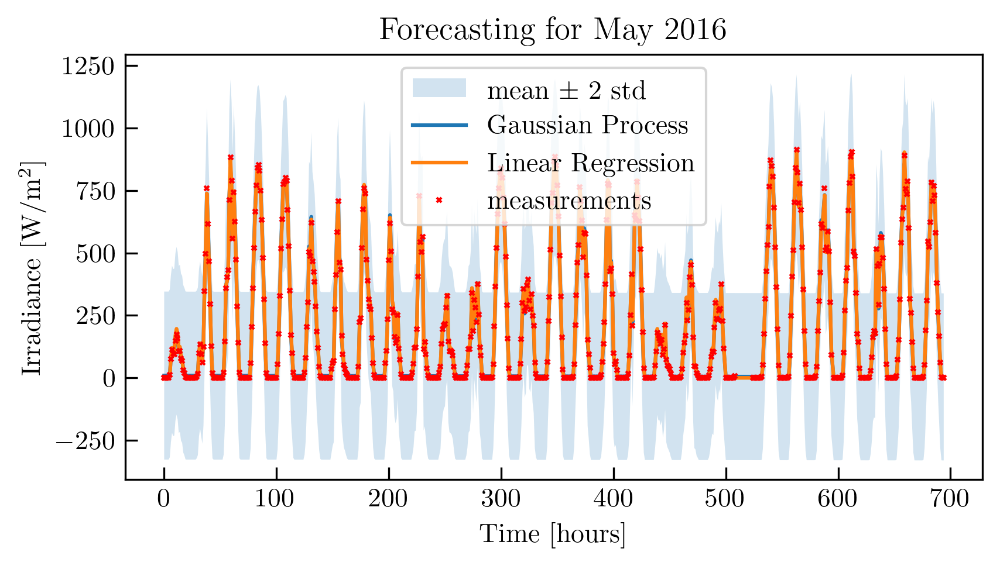

In [259]:
single_month = 5

test_data = pd.concat((nested_data[2016][single_month][day] for day in range(1, 30)))

# Create the DataFrame
test_data['datetime'] = pd.to_datetime(test_data['datetime'])

# Set the first element to have a value of zero, and the rest as hours passed after the first element
test_data['hours'] = (test_data['datetime'] - test_data['datetime'].iloc[0]).dt.total_seconds() / 3600

test_X = test_data[predictors].values
test_y = test_data[targets].values

y_pred_test, y_std_test = gpr.predict(xScaler.transform(test_X), return_std=True)

lin_pred = reg.predict(test_data["GHE"].values[:, np.newaxis])

if y_pred_test.ndim == 1:
    y_pred_rescale = yScaler.inverse_transform(y_pred_test.reshape(-1, 1))
    y_std_rescale = yScaler.inverse_transform(y_std_test.reshape(-1, 1))
elif y_pred_test.ndim == 2:
    y_pred_rescale = yScaler.inverse_transform(y_pred_test)
    y_std_rescale = yScaler.inverse_transform(y_std_test)

test_dates = np.array(test_X[:, 0], dtype=float)

plt.figure(figsize=(16*cm,8*cm))
plt.fill_between(test_dates,
                 y_pred_rescale[:, 0] + 2 * y_std_rescale[:, 0], 
                 y_pred_rescale[:, 0] - 2 * y_std_rescale[:, 0], 
                 alpha=0.2, 
                 label=r'mean $\pm$ 2 std')
plt.plot(test_dates, y_pred_rescale[:, 0], label="Gaussian Process")
plt.plot(test_dates, lin_pred, label="Linear Regression")
plt.plot(test_dates, test_y[:, 0], 'rx', markersize=2., label='measurements')
plt.ylabel('Irradiance [W/m$^2$]')
plt.xlabel('Time [hours]')
plt.title(f'Forecasting for {months[single_month-1]} 2016')
plt.legend(fontsize=fsize)
plt.show()

### Gaussian Process

In [112]:
r2score = gpr.score(X=xScaler.transform(test_X), y=yScaler.transform(test_y))
mse = mean_squared_error(test_y.squeeze(), yScaler.inverse_transform(y_pred_test[:, np.newaxis]).squeeze())
nrmse = ((yScaler.inverse_transform(y_pred_test[:, np.newaxis]).squeeze() - test_y.squeeze())**2).sum() / (test_y.squeeze() ** 2).sum()

print(f"R2 score: {r2score:.3f}")
print(f"Mean Squared Error: {mse:.3f}")
print(f"Normalized Root Mean Squared Error: {nrmse:.6f}")

R2 score: 0.999
Mean Squared Error: 72.700
Normalized Root Mean Squared Error: 0.000643


### Linear Regression

In [113]:
r2score = reg.score(test_data["GHE"].values[:, np.newaxis], test_data["GHI"].values)
mse = mean_squared_error(test_y.squeeze(), lin_pred)
nrmse = ((lin_pred - test_y.squeeze())**2).sum() / (test_y.squeeze() ** 2).sum()

print(f"R2 score: {r2score:.3f}")
print(f"Mean Squared Error: {mse:.3f}")
print(f"Normalized Root Mean Squared Error: {nrmse:.6f}")

R2 score: 0.999
Mean Squared Error: 90.161
Normalized Root Mean Squared Error: 0.000798


### Irradiance components constraint evaluation

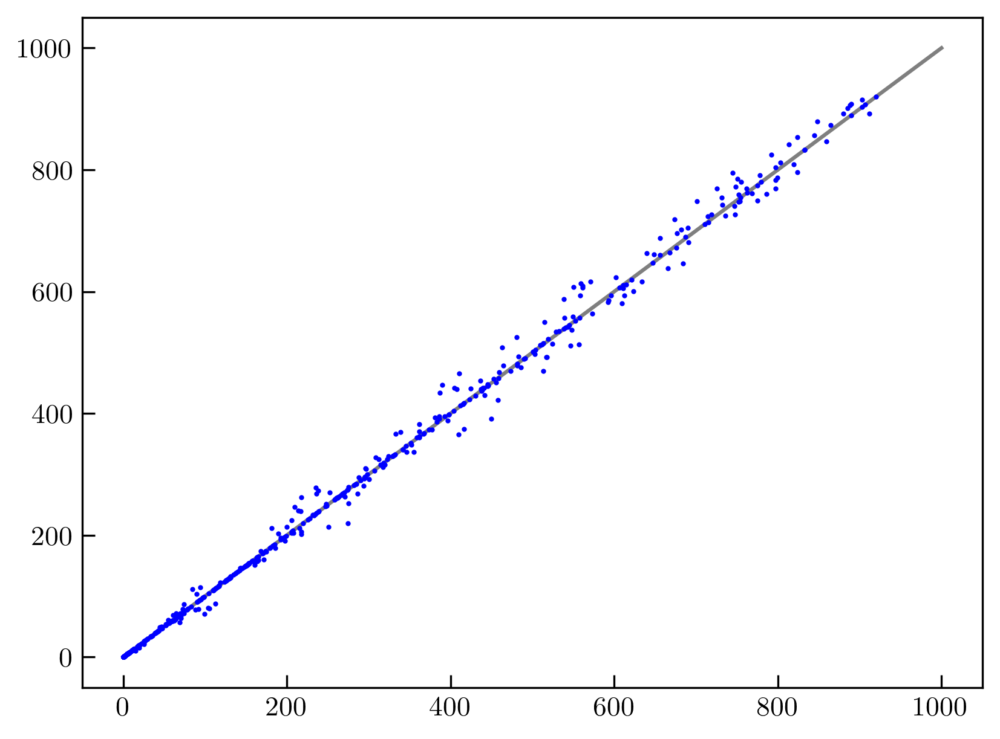

In [81]:
df = pd.concat((nested_data[2016][6][day] for day in range(1, 30)))
df["sol_alt"] = pd.to_numeric(df["sol_alt"], errors="coerce")

plt.figure()
plt.plot([0, 1000], [0, 1000], 'k', alpha=0.5)
plt.plot(df["GHI"], df["DNI"].values * np.sin(df["sol_alt"].values * np.pi / 180) + df["DHI"].values, 'bo', markersize=1.0)
plt.show()